# __Machine Learning for Prioritizing Blood Pressure Genes__ 

In [1]:
import re

import numpy as np
import pandas as pd
import scipy.cluster
from numpy import absolute, mean, sort, std
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist
from scipy.stats import spearmanr

regex = re.compile(r"\[|\]|<", re.IGNORECASE)

import matplotlib.pylab as plt
import seaborn as sns
import shap
import statsmodels.api as sm

%matplotlib inline
%config InlineBackend.figure_format ='retina'
import xgboost
from BorutaShap import BorutaShap
from matplotlib.pyplot import cm
from missingpy import MissForest
from sklearn import datasets, metrics, model_selection, preprocessing
from sklearn.metrics import (
    explained_variance_score,
    max_error,
    mean_absolute_error,
    mean_squared_error,
    r2_score,
)
from sklearn.model_selection import (
    GridSearchCV,
    KFold,
    LeaveOneOut,
    RandomizedSearchCV,
    RepeatedKFold,
    cross_val_predict,
    cross_val_score,
    cross_validate,
    learning_curve,
    train_test_split,
    validation_curve,
)
from skopt import BayesSearchCV
from skopt.plots import plot_convergence

sns.set_style("darkgrid")
sns.mpl.rcParams["figure.figsize"] = (15.0, 9.0)

import warnings

warnings.simplefilter(action="ignore", category=FutureWarning)
from warnings import filterwarnings

filterwarnings("ignore")

seed = 0

In [2]:
data = pd.read_csv("training_cleaned.csv", header=0, sep=",")

In [3]:
data["BPlabel_encoded"] = data["BPlabel"].map(
    {"most likely": 1, "probable": 0.75, "least likely": 0.1}
)
Y = data["BPlabel_encoded"]
data = data.drop(["BPlabel"], 1)
data.shape

(293, 22)

### Load Boruta Shap Feature Selected Features

In [77]:
X = pd.read_csv("selected_features_training_data.csv", header=0)
X = X.rename({"Cells - EBV-transformed lymphocytes_GTExTPM": "Lymphocytes_GTExTPM"}, axis=1)
X.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X.columns.values
]

In [78]:
df_gene = data[["Gene"]]

X = pd.concat([df_gene, X], axis=1)

X = X.set_index("Gene")

In [79]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

In [7]:
# Model parameters built from repeated nested CV benchmarking
xgb = xgboost.XGBRegressor(
    n_estimators=40,
    learning_rate=0.2,
    max_depth=4,
    reg_alpha=1,
    reg_lambda=1,
    random_state=seed,
    objective="reg:squarederror",
)

### Leave One Out Cross-validation

In [8]:
cv = LeaveOneOut()
scores = cross_val_score(xgb, X, Y, scoring="neg_mean_squared_error", cv=cv, n_jobs=-1)
scores = absolute(scores)
print("MAE: %.3f (%.3f)" % (mean(scores), std(scores)))

MAE: 0.031 (0.063)


In [9]:
xgb.fit(X_train, Y_train)
y_true = Y
y_pred = xgb.predict(X_test)
r2 = r2_score(Y_test, y_pred)
n = X_test.shape[0]
p = X_test.shape[1]
adj_rsquared = 1 - (1 - r2) * ((n - 1) / (n - p - 1))
print("Adjusted R Squared: {}".format(adj_rsquared))

Adjusted R Squared: 0.6712791181779277


### Predicted r2 vs r2

Predicted r2:
- It removes a data point from the dataset.
- Calculates the regression equation.
- Evaluates how well the model predicts the missing observation.
- And, repeats this for all data points in the dataset.

In [10]:
xgb.fit(X, Y)
y_true = Y
y_pred = xgb.predict(X)
xs = X


def press_statistic(y_true, y_pred, xs):
    res = y_pred - y_true
    hat = xs.dot(np.linalg.pinv(xs))
    den = 1 - np.diagonal(hat)
    sqr = np.square(res / den)
    return sqr.sum()


def predicted_r2(y_true, y_pred, xs):
    press = press_statistic(y_true=y_true, y_pred=y_pred, xs=xs)
    sst = np.square(y_true - y_true.mean()).sum()
    return 1 - press / sst


def r2(y_true, y_pred):
    sse = np.square(y_pred - y_true).sum()
    sst = np.square(y_true - y_true.mean()).sum()
    return 1 - sse / sst


print("xgb r2:", r2(y_true, y_pred))
print("xgb Predicted r2:", predicted_r2(y_true, y_pred, xs))

xgb r2: 0.9148803050925219
xgb Predicted r2: 0.8971949301899695


### Visualize Model Performance:

In [11]:
def perform_repeated_cv(X, Y, model):
    # set random seed for repeartability
    #    random.seed(1)

    # set the number of repetitions
    n_reps = 100

    # perform repeated cross validation
    r2_scores = np.zeros(n_reps)
    mse_scores = np.zeros(n_reps)

    for u in range(n_reps):

        # randomly shuffle the dataset
        indices = np.arange(X.shape[0])
        np.random.shuffle(indices)
        X = X.iloc[indices]
        Y = Y.iloc[indices]  # dataset has been randomly shuffled

        # initialize vector to keep predictions from all folds of the cross-validation
        y_predicted = np.zeros(Y.shape)

        # perform 10-fold cross validation
        kf = KFold(n_splits=5, random_state=seed)
        for train, test in kf.split(X):

            # split the dataset into training and testing
            X_train = X.iloc[train]
            X_test = X.iloc[test]
            y_train = Y.iloc[train]
            y_test = Y.iloc[test]

            # train model
            xgb = model
            xgb.fit(X_train, y_train)

            # make predictions on the testing set
            y_predicted[test] = xgb.predict(X_test)

        # record scores
        r2_scores[u] = r2_score(Y, y_predicted)
        mse_scores[u] = mean_squared_error(Y, y_predicted)

    # return all scores
    return r2_scores, mse_scores

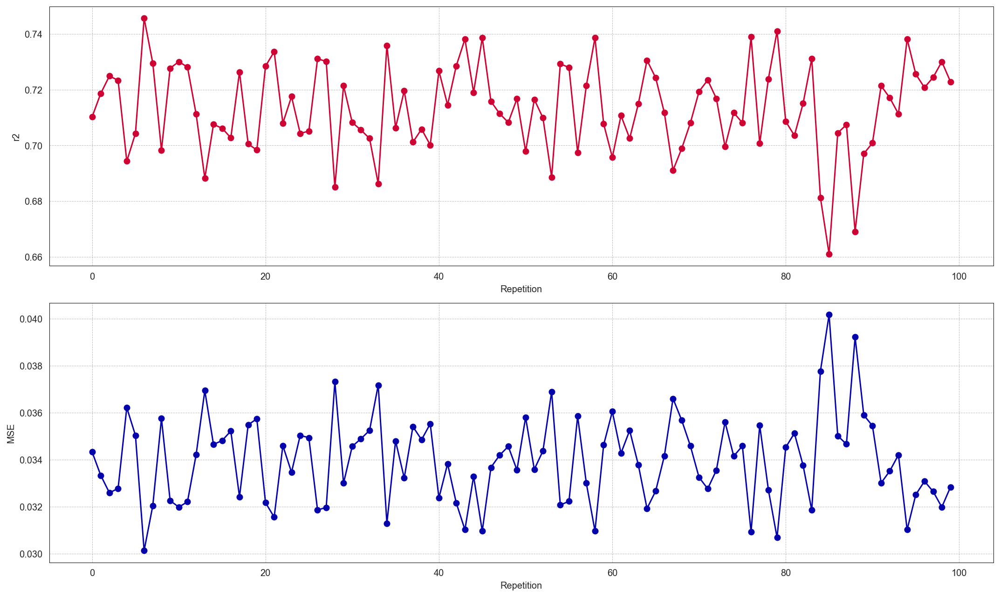

In [12]:
r2_scores, mse_scores = perform_repeated_cv(X, Y, xgb)

# plot results from the 100 repetitions
fig, axes = plt.subplots(2, 1)

axes[0].plot(r2_scores, color="xkcd:cherry", marker="o")
axes[0].set_xlabel("Repetition")
axes[0].set_ylabel("r2")
axes[0].set_facecolor((1, 1, 1))
axes[0].spines["left"].set_color("black")
axes[0].spines["right"].set_color("black")
axes[0].spines["top"].set_color("black")
axes[0].spines["bottom"].set_color("black")
axes[0].spines["left"].set_linewidth(0.5)
axes[0].spines["right"].set_linewidth(0.5)
axes[0].spines["top"].set_linewidth(0.5)
axes[0].spines["bottom"].set_linewidth(0.5)
axes[0].grid(linestyle="--", linewidth="0.5", color="grey", alpha=0.5)

axes[1].plot(mse_scores, color="xkcd:royal blue", marker="o")
axes[1].set_xlabel("Repetition")
axes[1].set_ylabel("MSE")
axes[1].set_facecolor((1, 1, 1))
axes[1].spines["left"].set_color("black")
axes[1].spines["right"].set_color("black")
axes[1].spines["top"].set_color("black")
axes[1].spines["bottom"].set_color("black")
axes[1].spines["left"].set_linewidth(0.5)
axes[1].spines["right"].set_linewidth(0.5)
axes[1].spines["top"].set_linewidth(0.5)
axes[1].spines["bottom"].set_linewidth(0.5)
axes[1].grid(linestyle="--", linewidth="0.5", color="grey", alpha=0.5)


plt.grid(True)
plt.tight_layout()

### Training Data Prediction Visualization:

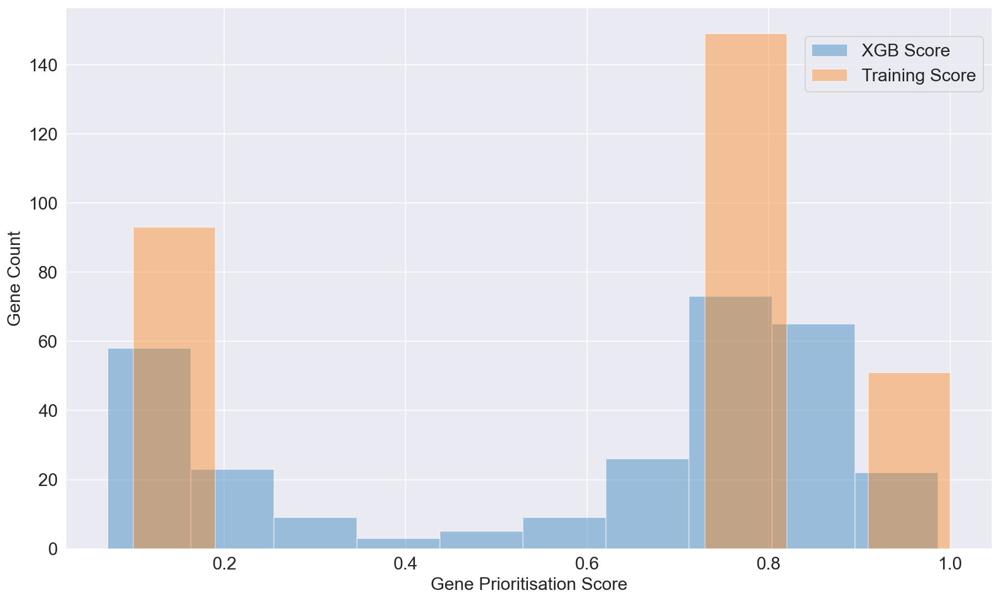

In [13]:
predictions = list(xgb.predict(X))

output = pd.Series(data=predictions, index=X.index, name="XGB_Score")

df_total_training = pd.concat([X, output], axis=1)

df_total = pd.concat([X, output], axis=1)

fig, ax = plt.subplots()

sns.distplot(df_total["XGB_Score"], ax=ax, kde=False, norm_hist=False, bins=10)
sns.distplot(Y, ax=ax, kde=False, bins=10)
fig.legend(
    labels=["XGB Score", "Training Score"],
    loc="upper right",
    bbox_to_anchor=(0.83, 0.8),
    ncol=1,
    fontsize=16,
)
ax.set_xlabel("Gene Prioritisation Score", fontsize=16)
ax.set_ylabel("Gene Count", fontsize=16)
ax.tick_params(labelsize=16)

In [14]:
predictions = list(xgb.predict(X))

output = pd.Series(data=predictions, index=X.index, name="XGB_Score")

output = output.to_frame()
output.reset_index(level=0, inplace=True)

output

,Gene,XGB_Score
0,ABCC9,0.985928
1,AC006455.1,0.138889
2,AC007216.2,0.117454
3,AC007461.1,0.112831
4,AC008498.1,0.160757
...,...,...
288,YES1,0.868306
289,Z98049.1,0.112831
290,ZAP70,0.799710
291,ZMYM6NB,0.145055


In [15]:
print(data[["Gene", "BPlabel_encoded"]])

df_b = data[["BPlabel_encoded"]]

df_c = pd.concat([output, df_b], axis=1)
df_c

           Gene  BPlabel_encoded
0         ABCC9             1.00
1    AC006455.1             0.10
2    AC007216.2             0.10
3    AC007461.1             0.10
4    AC008498.1             0.10
..          ...              ...
288        YES1             0.75
289    Z98049.1             0.10
290       ZAP70             0.75
291     ZMYM6NB             0.10
292     ZSCAN5D             0.10

[293 rows x 2 columns]


,Gene,XGB_Score,BPlabel_encoded
0,ABCC9,0.985928,1.00
1,AC006455.1,0.138889,0.10
2,AC007216.2,0.117454,0.10
3,AC007461.1,0.112831,0.10
4,AC008498.1,0.160757,0.10
...,...,...,...
288,YES1,0.868306,0.75
289,Z98049.1,0.112831,0.10
290,ZAP70,0.799710,0.75
291,ZMYM6NB,0.145055,0.10


### SHAP Feature Importance Visualization:

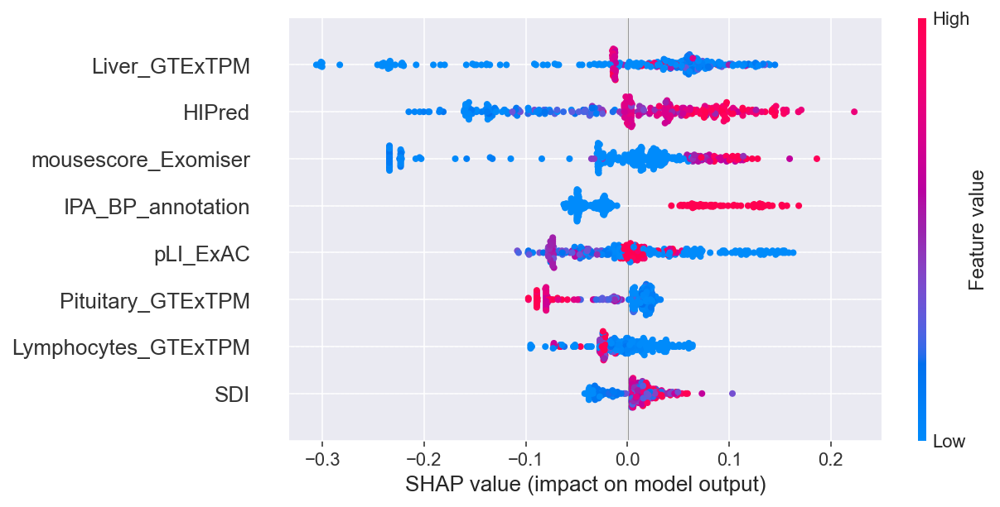

In [80]:
xgb.fit(X, Y)
explainer = shap.TreeExplainer(xgb)
shap_values = explainer.shap_values(X)
shap.summary_plot(shap_values, X)

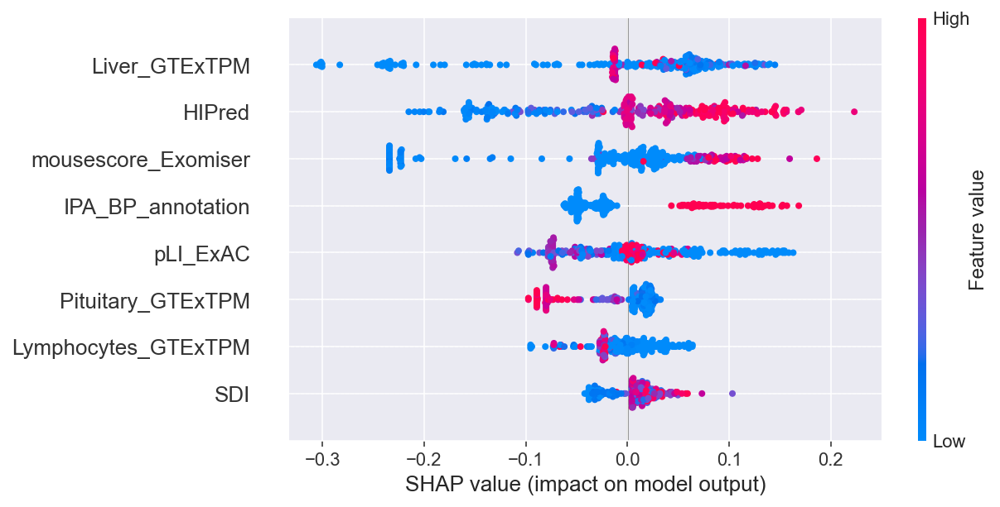

In [81]:
fig, ax = plt.subplots()
shap.summary_plot(shap_values, X)
fig.savefig("shap_summary.png", format="png", dpi=300, bbox_inches="tight")

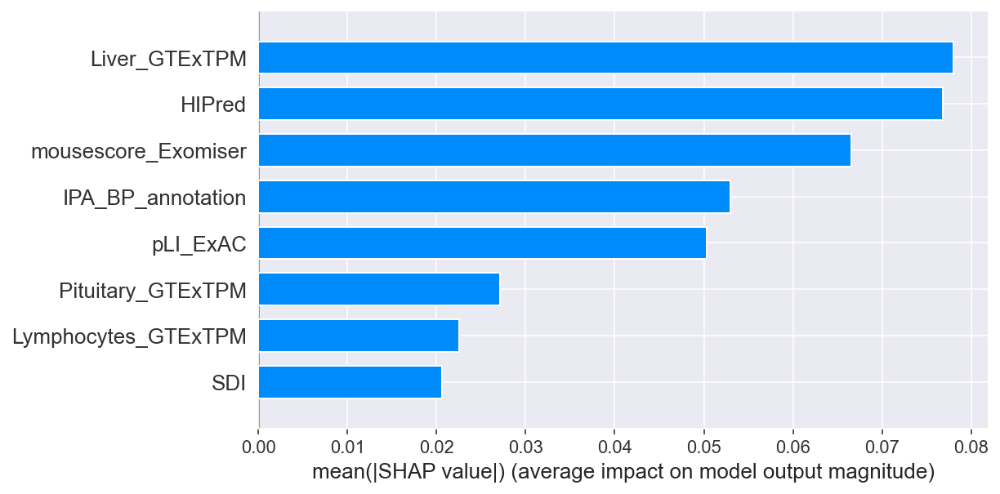

In [82]:
shap.summary_plot(shap_values, X, plot_type="bar")

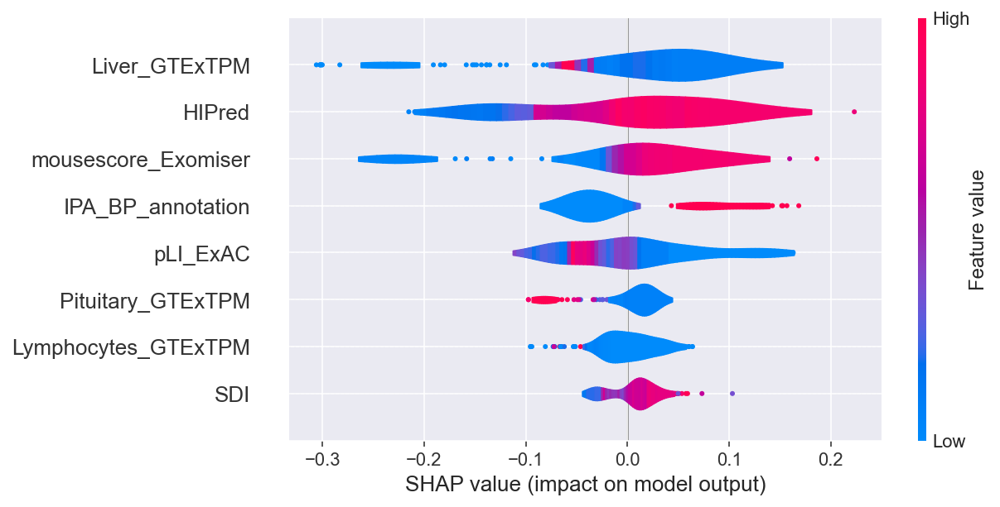

In [83]:
shap.summary_plot(shap_values, X, plot_type="violin", color="coolwarm")

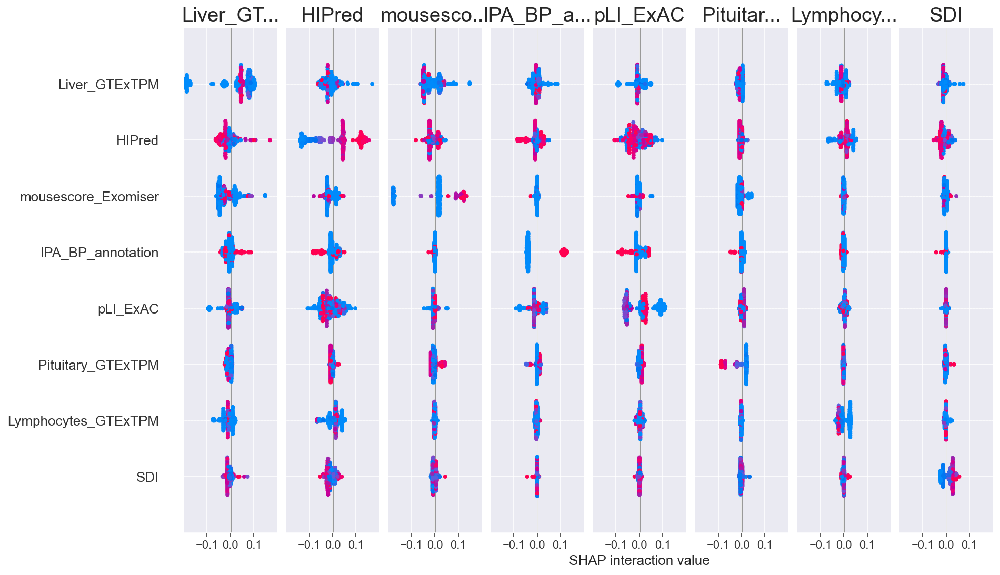

In [84]:
X_interaction = X
shap_interaction_values = shap.TreeExplainer(xgb).shap_interaction_values(X_interaction)
X_interaction2 = pd.DataFrame(data=X_interaction, columns=X.columns)
shap.summary_plot(shap_interaction_values, X_interaction2, max_display=8)

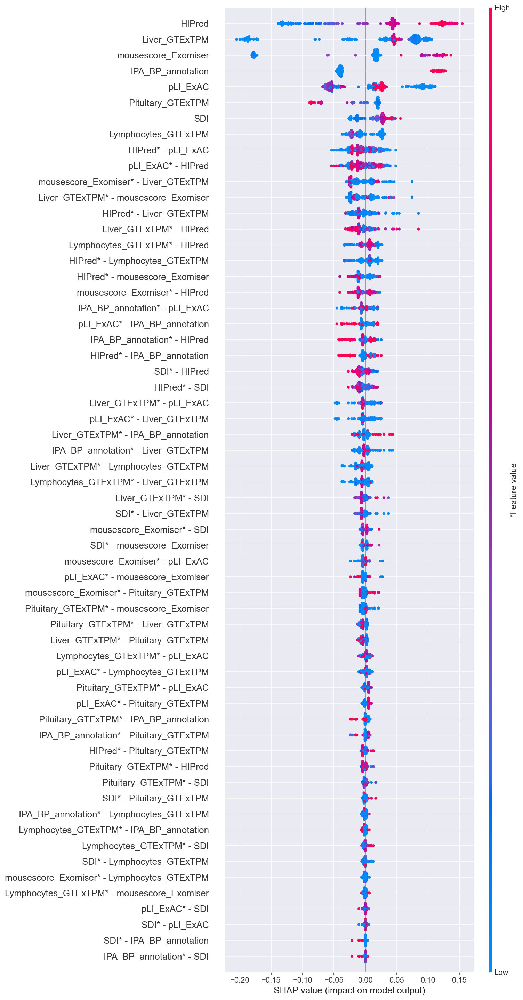

In [85]:
shap.summary_plot(
    shap_interaction_values, X_interaction2, max_display=60, plot_type="compact_dot"
)

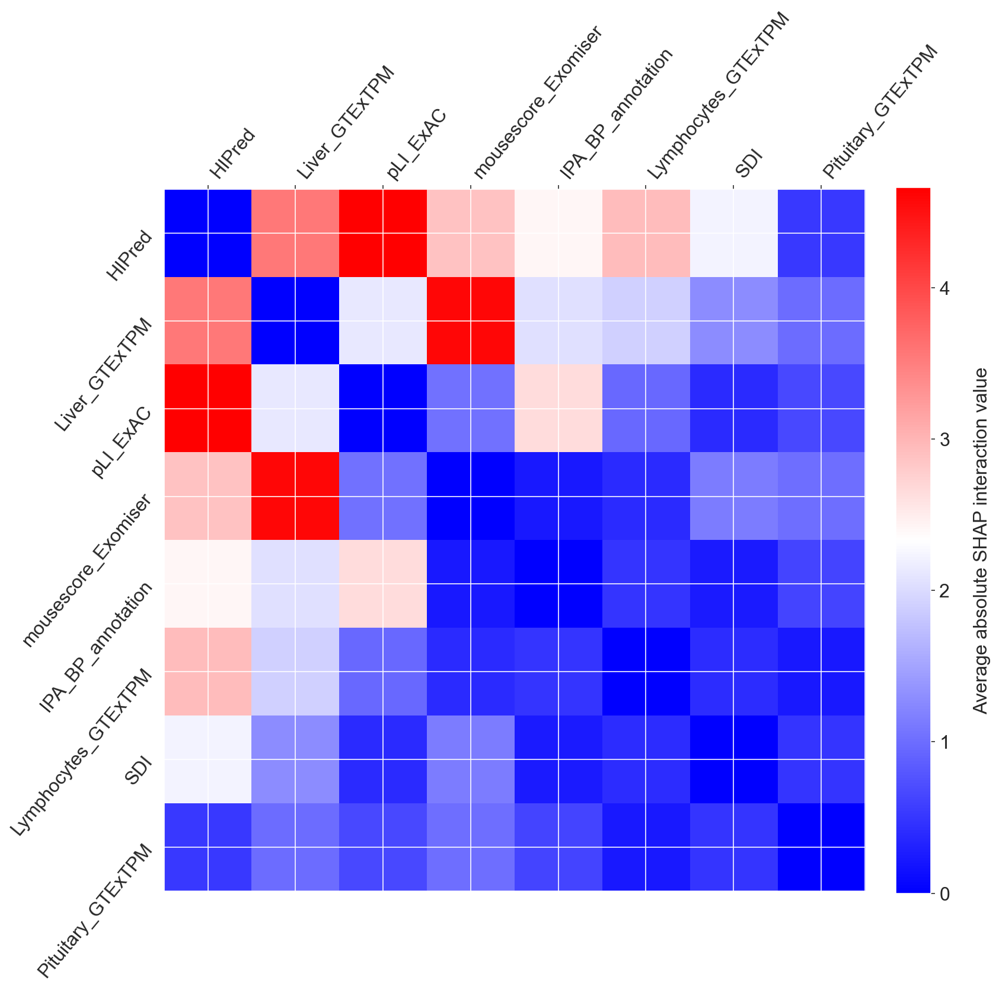

In [86]:
tmp = np.abs(shap_interaction_values).sum(0)
for i in range(tmp.shape[0]):
    tmp[i, i] = 0
inds = np.argsort(-tmp.sum(0))[:50]
tmp2 = tmp[inds, :][:, inds]


f = plt.figure(figsize=(12, 12))
plt.imshow(
    tmp2, cmap="bwr"
)  # https://matplotlib.org/stable/gallery/color/colormap_reference.html
plt.yticks(
    range(tmp2.shape[0]),
    X_interaction.columns[inds],
    rotation=50.4,
    horizontalalignment="right",
)
plt.xticks(
    range(tmp2.shape[0]),
    X_interaction.columns[inds],
    rotation=50.4,
    horizontalalignment="left",
)
plt.gca().xaxis.tick_top()
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label("Average absolute SHAP interaction value", size=16, labelpad=20)
plt.rcParams.update({"font.size": 16})
plt.tight_layout()
f.savefig("shap_interactions.png", format="png", dpi=300)


# plt.show()

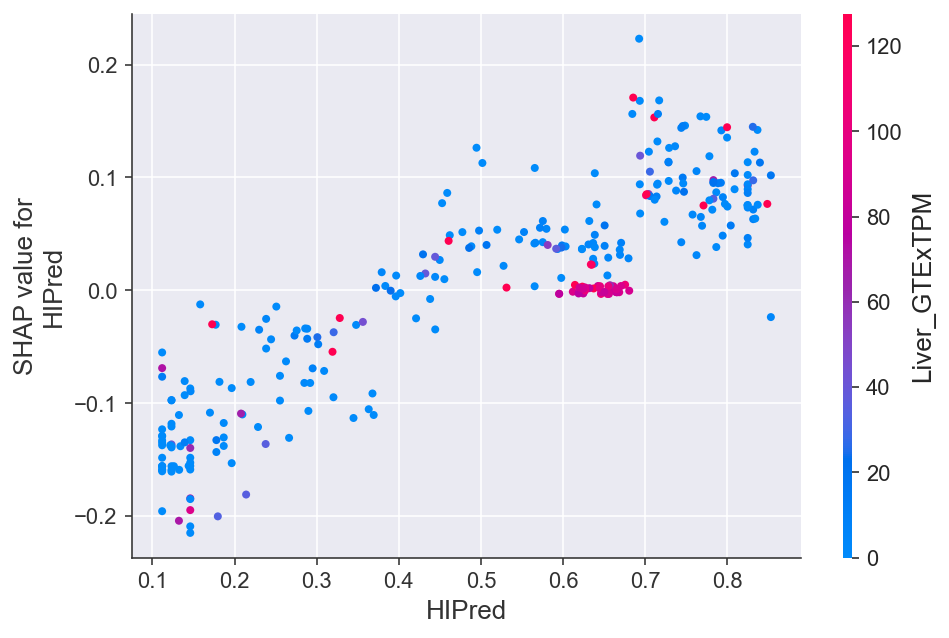

In [87]:
shap.dependence_plot(
    "HIPred", shap_values, X, interaction_index="Liver_GTExTPM"
)

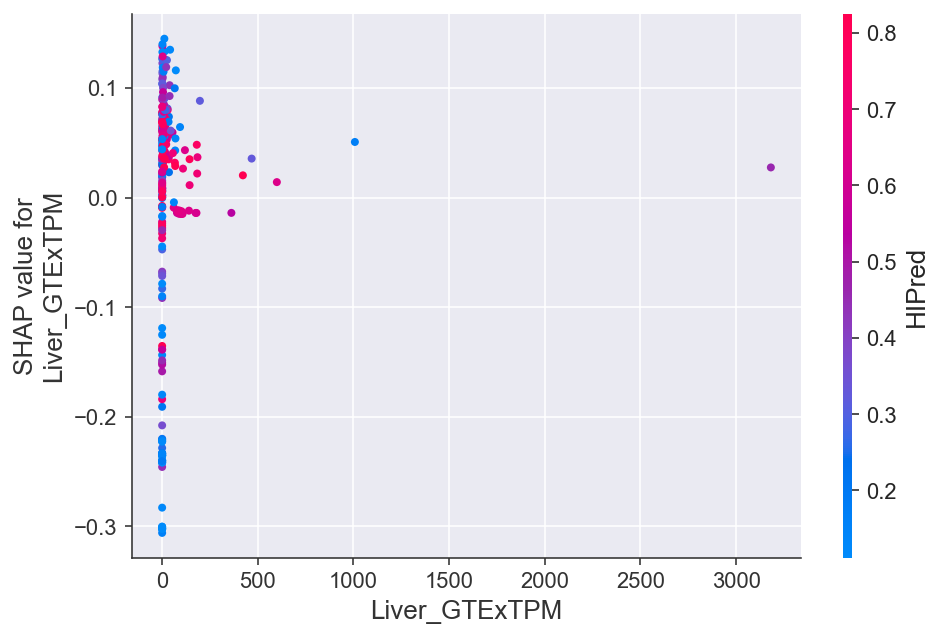

In [88]:
shap.dependence_plot(
    "Liver_GTExTPM", shap_values, X, interaction_index="HIPred"
)

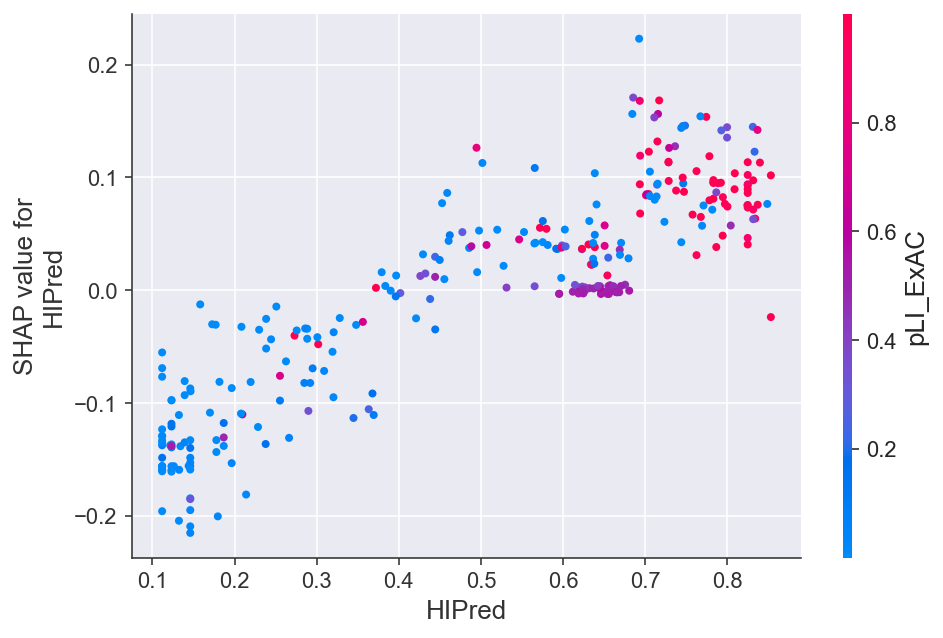

In [89]:
shap.dependence_plot("HIPred", shap_values, X, interaction_index="pLI_ExAC")

In [90]:
expected_value = explainer.expected_value

if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer expected value: {expected_value}")

select = range(8)
features = X_test.iloc[select]


with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    shap_values = explainer.shap_values(features)[1]
    shap_interaction_values = explainer.shap_interaction_values(features)
if isinstance(shap_interaction_values, list):
    shap_interaction_values = shap_interaction_values[1]

Explainer expected value: 0.5860503315925598


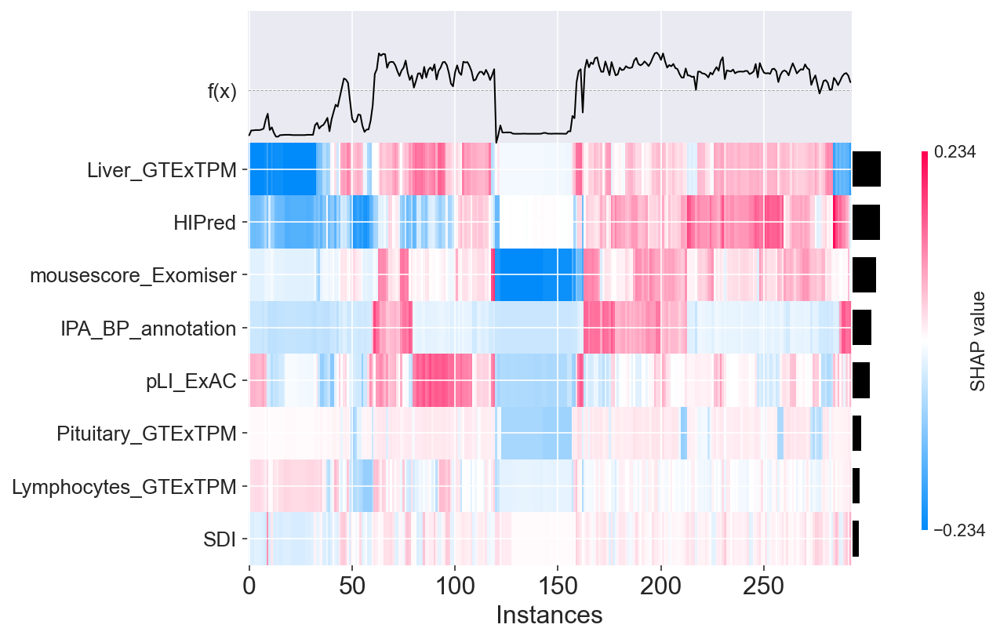

In [91]:
# https://shap.readthedocs.io/en/latest/example_notebooks/api_examples/plots/heatmap.html

shap_values = explainer(X)
fig, ax = plt.subplots()
shap.plots.heatmap(shap_values)
fig.savefig("shap_heatmap.png", format="png", dpi=300, bbox_inches="tight")

In [92]:
select = range(8)
features = X.iloc[select]
features_display = X.loc[features.index]
shap_values = explainer.shap_values(X)

In [93]:
shap.initjs()
shap.force_plot(
    explainer.expected_value, shap_values[:293, :], X.iloc[:293, :], features_display,
)

In [94]:
output_of_force_plot = shap.force_plot(
    explainer.expected_value,
    shap_values[:293, :],
    X.iloc[:293, :],
    features_display,
    show=False,
)
file = "force_plot.html"
shap.save_html(file, output_of_force_plot)

### SHAP average measures per gene and per feature:

In [95]:
explainer = shap.Explainer(xgb, X)
shap_values2 = explainer.shap_values(X)
features = X.columns.values.tolist()

shapdf = pd.DataFrame(data=np.array(shap_values2), columns=features)
shapdf["shap_average"] = shapdf.mean(axis=1)
shapdf

,SDI,Liver_GTExTPM,Lymphocytes_GTExTPM,Pituitary_GTExTPM,pLI_ExAC,mousescore_Exomiser,HIPred,IPA_BP_annotation,shap_average
0,0.019092,0.052530,0.023569,0.028943,0.056101,0.083075,0.058394,0.088108,0.051227
1,0.002826,-0.020640,-0.024828,-0.074563,-0.093440,-0.216871,0.022236,-0.040281,-0.055695
2,0.002582,-0.019354,-0.024205,-0.066368,-0.093166,-0.227509,0.014633,-0.040281,-0.056708
3,0.001321,-0.020980,-0.026624,-0.075519,-0.098294,-0.216886,0.022439,-0.040281,-0.056853
4,0.002582,-0.021132,-0.028113,-0.075519,-0.069260,-0.215681,0.019448,-0.040281,-0.053494
...,...,...,...,...,...,...,...,...,...
288,0.015058,0.063393,0.003226,0.019433,0.021012,0.034753,0.156333,-0.017743,0.036933
289,0.002544,-0.021270,-0.024619,-0.075519,-0.092876,-0.216871,0.014068,-0.040281,-0.056853
290,0.012464,0.058806,-0.021201,0.010394,-0.046277,0.040397,0.153367,-0.018817,0.023642
291,0.001726,-0.019492,-0.030148,-0.066368,-0.094422,-0.227512,0.023425,-0.040281,-0.056634


In [96]:
df_d = pd.concat([df_c, shapdf], axis=1)
df_d.to_csv("training_features_shapavg.csv", index=False)
df_d

,Gene,XGB_Score,BPlabel_encoded,SDI,Liver_GTExTPM,Lymphocytes_GTExTPM,Pituitary_GTExTPM,pLI_ExAC,mousescore_Exomiser,HIPred,IPA_BP_annotation,shap_average
0,ABCC9,0.980824,1.00,0.019092,0.052530,0.023569,0.028943,0.056101,0.083075,0.058394,0.088108,0.051227
1,AC006455.1,0.125451,0.10,0.002826,-0.020640,-0.024828,-0.074563,-0.093440,-0.216871,0.022236,-0.040281,-0.055695
2,AC007216.2,0.117344,0.10,0.002582,-0.019354,-0.024205,-0.066368,-0.093166,-0.227509,0.014633,-0.040281,-0.056708
3,AC007461.1,0.116189,0.10,0.001321,-0.020980,-0.026624,-0.075519,-0.098294,-0.216886,0.022439,-0.040281,-0.056853
4,AC008498.1,0.143057,0.10,0.002582,-0.021132,-0.028113,-0.075519,-0.069260,-0.215681,0.019448,-0.040281,-0.053494
...,...,...,...,...,...,...,...,...,...,...,...,...
288,YES1,0.866477,0.75,0.015058,0.063393,0.003226,0.019433,0.021012,0.034753,0.156333,-0.017743,0.036933
289,Z98049.1,0.116189,0.10,0.002544,-0.021270,-0.024619,-0.075519,-0.092876,-0.216871,0.014068,-0.040281,-0.056853
290,ZAP70,0.760145,0.75,0.012464,0.058806,-0.021201,0.010394,-0.046277,0.040397,0.153367,-0.018817,0.023642
291,ZMYM6NB,0.117941,0.10,0.001726,-0.019492,-0.030148,-0.066368,-0.094422,-0.227512,0.023425,-0.040281,-0.056634


In [97]:
df_e = df_d[["Gene", "XGB_Score", "shap_average", "BPlabel_encoded"]]
df_e.to_csv("training_genes_shapavg.csv", index=False)
df_e

,Gene,XGB_Score,shap_average,BPlabel_encoded
0,ABCC9,0.980824,0.051227,1.00
1,AC006455.1,0.125451,-0.055695,0.10
2,AC007216.2,0.117344,-0.056708,0.10
3,AC007461.1,0.116189,-0.056853,0.10
4,AC008498.1,0.143057,-0.053494,0.10
...,...,...,...,...
288,YES1,0.866477,0.036933,0.75
289,Z98049.1,0.116189,-0.056853,0.10
290,ZAP70,0.760145,0.023642,0.75
291,ZMYM6NB,0.117941,-0.056634,0.10


## Decision Plots:
- The plot is centered on the x-axis at explainer.expected_value. All SHAP values are relative to the model's expected value like a linear model's effects are relative to the intercept.
- The y-axis lists the model's features. By default, the features are ordered by descending importance. The importance is calculated over the observations plotted. _This is usually different than the importance ordering for the entire dataset._ In addition to feature importance ordering, the decision plot also supports hierarchical cluster feature ordering and user-defined feature ordering.
- Each observation's prediction is represented by a colored line. At the top of the plot, each line strikes the x-axis at its corresponding observation's predicted value. This value determines the color of the line on a spectrum.
- Moving from the bottom of the plot to the top, SHAP values for each feature are added to the model's base value. This shows how each feature contributes to the overall prediction.
- At the bottom of the plot, the observations converge at explainer.expected_value.

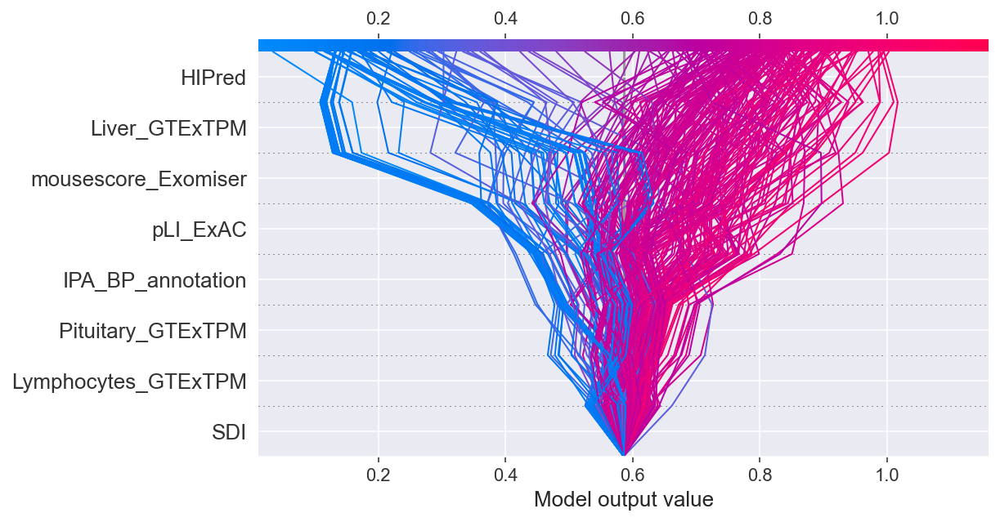

In [98]:
shap.decision_plot(
    expected_value, explainer.shap_values(X), features_display, ignore_warnings=True,
)

In [101]:
X = pd.read_csv("selected_features_training_data.csv", header=0)
X = X.rename({"Cells - EBV-transformed lymphocytes_GTExTPM": "Lymphocytes_GTExTPM"}, axis=1)
X.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X.columns.values
]

In [102]:
y_pred = xgb.predict(X)

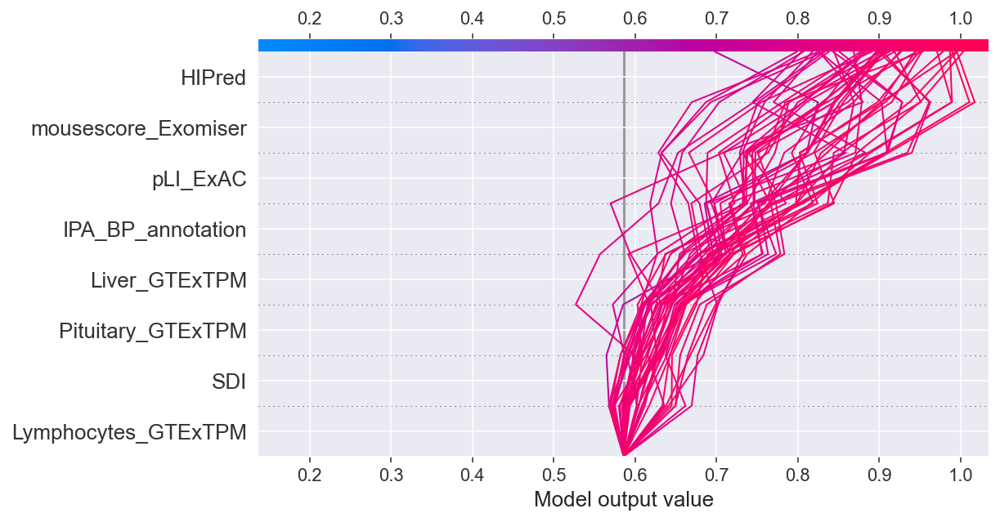

In [103]:
T = X
T = T[(Y == 1)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)

fig, ax = plt.subplots()
shap.decision_plot(expected_value, sh, T, return_objects=True)
fig.savefig("shap_51genes.png", format="png", dpi=300, bbox_inches="tight")

In [ ]:
y_pred = xgb.predict(X)
T = X[(y_pred <= 0.7)]
T = T[(Y == 1)]
T.shape

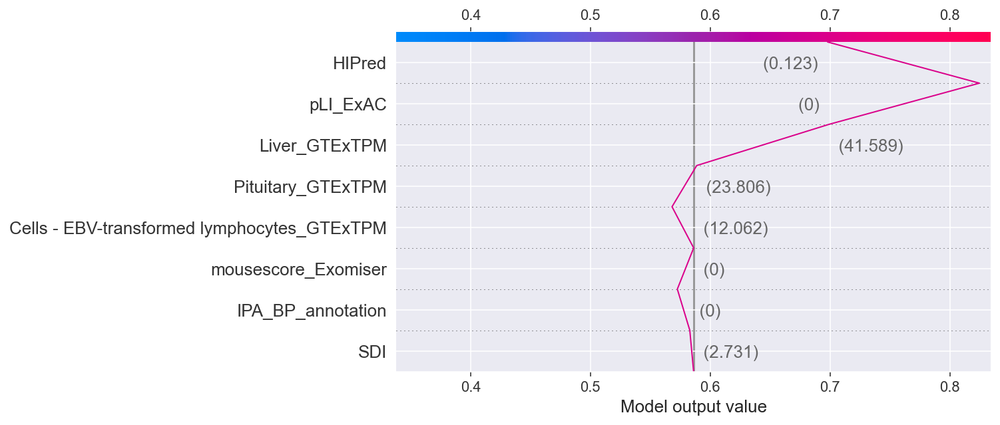

In [41]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)

r = shap.decision_plot(expected_value, sh, T, return_objects=True)
# ACBD4

In [42]:
print(T)

         SDI  Liver_GTExTPM  Cells - EBV-transformed lymphocytes_GTExTPM  \
20  2.731291        41.5886                                       12.062   

    Pituitary_GTExTPM  pLI_ExAC  mousescore_Exomiser    HIPred  \
20            23.8061  0.000018                  0.0  0.123297   

    IPA_BP_annotation  
20                0.0  


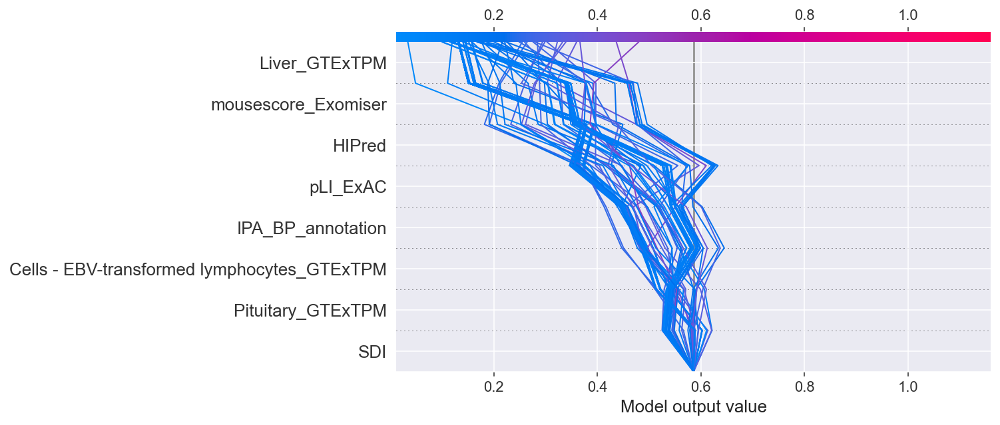

In [43]:
y_pred = xgb.predict(X)
T = X
T = T[(Y == 0.1)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

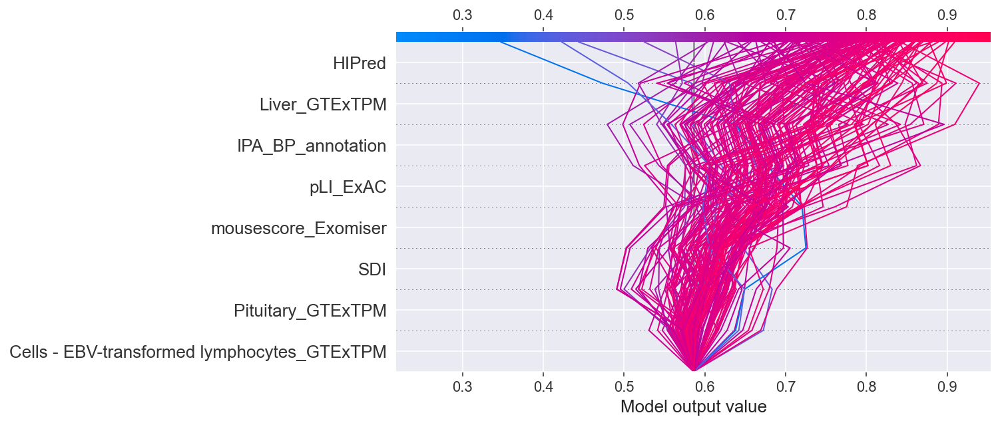

In [44]:
y_pred = xgb.predict(X)
T = X
T = T[(Y == 0.75)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

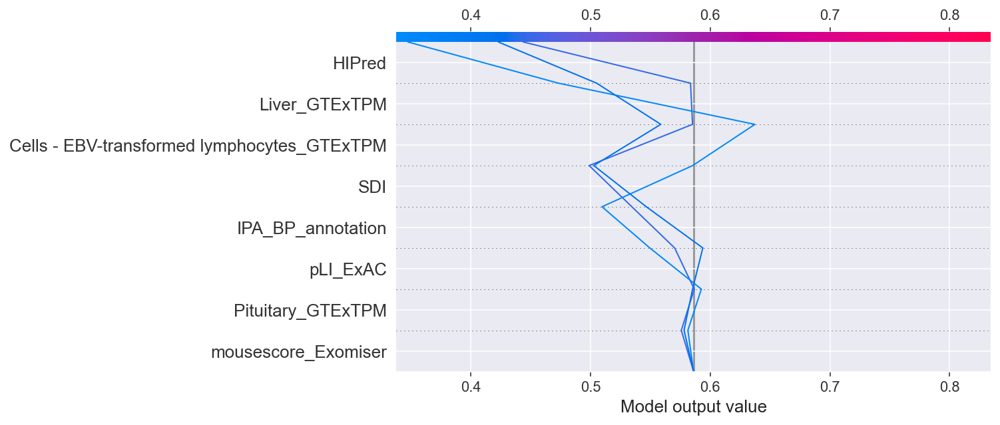

In [45]:
T = X[(y_pred <= 0.5)]
T = T[(Y == 0.75)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [46]:
print(T)

          SDI  Liver_GTExTPM  Cells - EBV-transformed lymphocytes_GTExTPM  \
40   1.990241       0.153082                                     0.000000   
109  4.950132       0.000000                                     0.000000   
234  1.707050       0.069440                                     0.064224   

     Pituitary_GTExTPM  pLI_ExAC  mousescore_Exomiser    HIPred  \
40            0.901954  0.039183                  0.0  0.146139   
109           0.000000  0.162839                  0.0  0.123297   
234           0.082736  0.054417                  0.0  0.292119   

     IPA_BP_annotation  
40                 0.0  
109                0.0  
234                0.0  


In [47]:
X = pd.read_csv("selected_features_training_data.csv", header=0)
X.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X.columns.values
]
df_gene = data[["Gene"]]

X = pd.concat([df_gene, X], axis=1)

X = X.set_index("Gene")

X.iloc[40]

SDI                                            1.990241
Liver_GTExTPM                                  0.153082
Cells - EBV-transformed lymphocytes_GTExTPM    0.000000
Pituitary_GTExTPM                              0.901954
pLI_ExAC                                       0.039183
mousescore_Exomiser                            0.000000
HIPred                                         0.146139
IPA_BP_annotation                              0.000000
Name: ARMS2, dtype: float64

In [48]:
X.iloc[[40], :]

,SDI,Liver_GTExTPM,Cells - EBV-transformed lymphocytes_GTExTPM,Pituitary_GTExTPM,pLI_ExAC,mousescore_Exomiser,HIPred,IPA_BP_annotation
Gene,,,,,,,,
ARMS2,1.990241,0.153082,0.0,0.901954,0.039183,0.0,0.146139,0.0


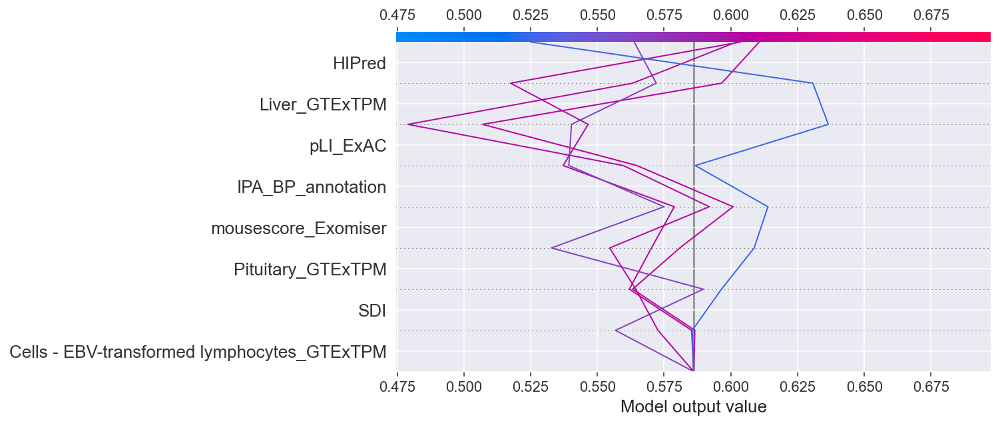

In [49]:
y_pred = xgb.predict(X)

T = X[(y_pred >= 0.5) & (y_pred <= 0.6)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [50]:
predictions = list(xgb.predict(X))

output = pd.Series(data=predictions, index=X.index, name="XGB_Score")

output = output.to_frame()
output.reset_index(level=0, inplace=True)

output

df_b = data[["BPlabel_encoded"]]

df_c = pd.concat([output, df_b], axis=1)
df_c

,Gene,XGB_Score,BPlabel_encoded
0,ABCC9,0.980824,1.00
1,AC006455.1,0.125451,0.10
2,AC007216.2,0.117344,0.10
3,AC007461.1,0.116189,0.10
4,AC008498.1,0.143057,0.10
...,...,...,...
288,YES1,0.866477,0.75
289,Z98049.1,0.116189,0.10
290,ZAP70,0.760145,0.75
291,ZMYM6NB,0.117941,0.10


In [51]:
def shap_plot(j):
    explainerModel = shap.TreeExplainer(xgb)
    shap_values_Model = explainerModel.shap_values(X)
    p = shap.force_plot(
        explainerModel.expected_value,
        shap_values_Model[j],
        X.iloc[[j]],
        feature_names=X.columns,
    )
    return p


# fig, ax = plt.subplots()
shap_plot(20)
# fig.savefig('bdnf_force.png', format='png', dpi=300, bbox_inches = "tight")

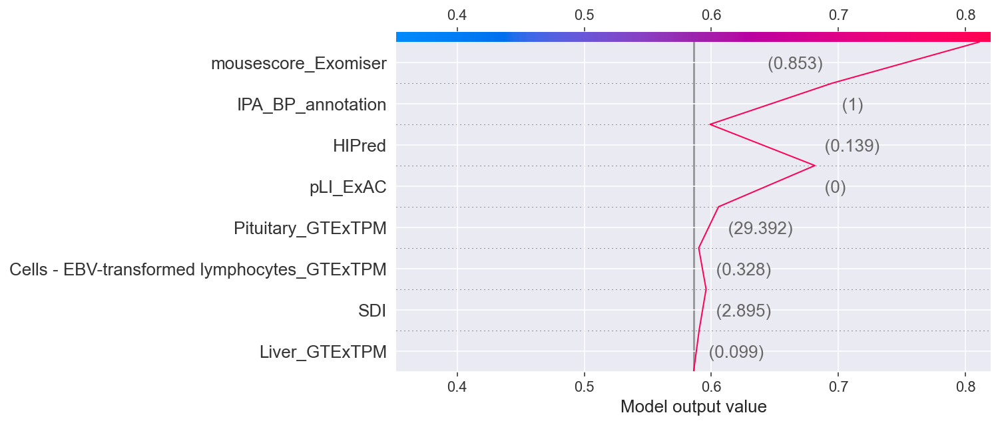

In [52]:
# EDNRA
shap.decision_plot(
    expected_value,
    explainer.shap_values(X.iloc[[68]]),
    X.iloc[68],
    list(features_display),
)

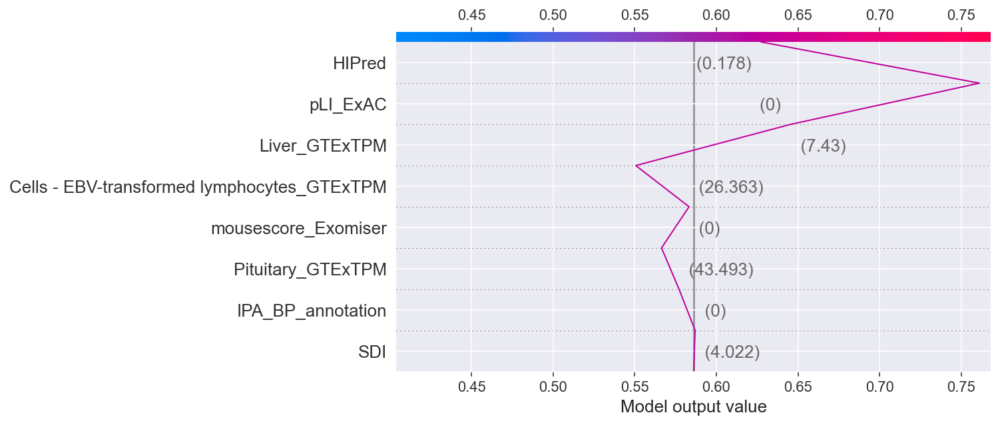

In [53]:
shap.decision_plot(
    expected_value,
    explainer.shap_values(X.iloc[83]),
    X.iloc[83],
    list(features_display),
)

## Unknown Gene Prediction

In [54]:
dataset_unknown = pd.read_csv("predicted_data.txt", sep="\t")
dataset_unknown = dataset_unknown.rename({"IPA_BP": "IPA_BP_annotation"}, axis=1)
df2 = dataset_unknown[
    [
        "SDI",
        "Liver_GTExTPM",
        "Cells - EBV-transformed lymphocytes_GTExTPM",
        "Pituitary_GTExTPM",
        "pLI_ExAC",
        "mousescore_Exomiser",
        "HIPred",
        "IPA_BP_annotation",
    ]
]

df2.shape

(1804, 8)

In [55]:
imputer = MissForest(random_state=seed)
df3 = imputer.fit_transform(df2)

Iteration: 0
Iteration: 1
Iteration: 2


In [56]:
X2 = pd.DataFrame(df3, index=df2.index, columns=df2.columns)

X2.shape

(1804, 8)

In [57]:
model = xgb
model.fit(X, Y)
predictions = list(model.predict(X2))

output = pd.Series(data=predictions, index=dataset_unknown.index, name="XGB_Score")

df_total = pd.concat([dataset_unknown, output], axis=1)

In [58]:
df_total.nlargest(10, "XGB_Score", keep="last")

,Gene,REVEL.max,MetaSVM_rankscore.max,MetaLR_rankscore.max,MCAP.max,wgEncodeBroadHmmHuvecHMM.count,betamax,logpval_gwascatalog,Adipose - Subcutaneous_GTExTPM,Adipose - Visceral (Omentum)_GTExTPM,...,MetaLR_rankscore,MetaSVM_rankscore,MutationAssessor_rankscore,REVEL_score,fathmm-MKL_coding_score,integrated_fitCons_rankscore,LoFtool,GERP_Rankscore,BPlabel,XGB_Score
331,COL15A1,0.412,0.876,0.880,NaN,33,-0.3010,23.30103,126.192000,75.095400,...,NaN,NaN,NaN,NaN,NaN,NaN,0.232,NaN,unknown,0.977636
1505,SMOC2,NaN,NaN,NaN,NaN,230,-0.4184,22.30103,75.416100,71.252200,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,0.957912
827,MLIP,0.000,0.354,0.075,NaN,10,-0.1964,13.00000,0.673251,0.293427,...,0.48084,0.63282,0.97045,0.508,0.98749,0.97801,0.280,0.81769,unknown,0.956034
1444,SGCD,NaN,NaN,NaN,NaN,280,0.2110,10.00000,3.075140,2.000780,...,NaN,NaN,NaN,NaN,NaN,NaN,0.276,NaN,unknown,0.945889
306,CHRM2,NaN,NaN,NaN,NaN,494,0.4323,12.00000,0.004196,0.023050,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,0.940262
329,COG2,0.110,0.339,0.006,NaN,796,-0.3285,5.09691,14.409000,11.299500,...,NaN,NaN,NaN,NaN,NaN,NaN,0.854,NaN,unknown,0.931486
463,ELK3,NaN,NaN,NaN,NaN,21,-0.4724,10.69897,58.474600,48.517600,...,0.20672,0.30227,NaN,0.006,0.01204,0.37627,NaN,0.03257,unknown,0.929442
1513,SNTB2,0.106,NaN,NaN,NaN,15,-0.1717,12.30103,22.574200,16.015500,...,0.96265,0.94265,0.82220,0.775,0.97777,0.81865,0.905,0.69459,unknown,0.928734
114,ARHGEF26,0.456,0.792,0.653,NaN,222,0.6269,10.00000,10.389700,7.280710,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,0.921314
1171,PTPN3,0.354,0.331,0.000,NaN,25,-0.2487,9.39794,3.491070,3.822930,...,0.63929,0.64722,0.50145,0.251,0.99233,0.92422,0.485,0.91077,unknown,0.920013


In [59]:
df_file = df_total[["Gene", "XGB_Score"]]
df_file = df_file.nlargest(1804, "XGB_Score", keep="last")

### Model Prediction Distribution:

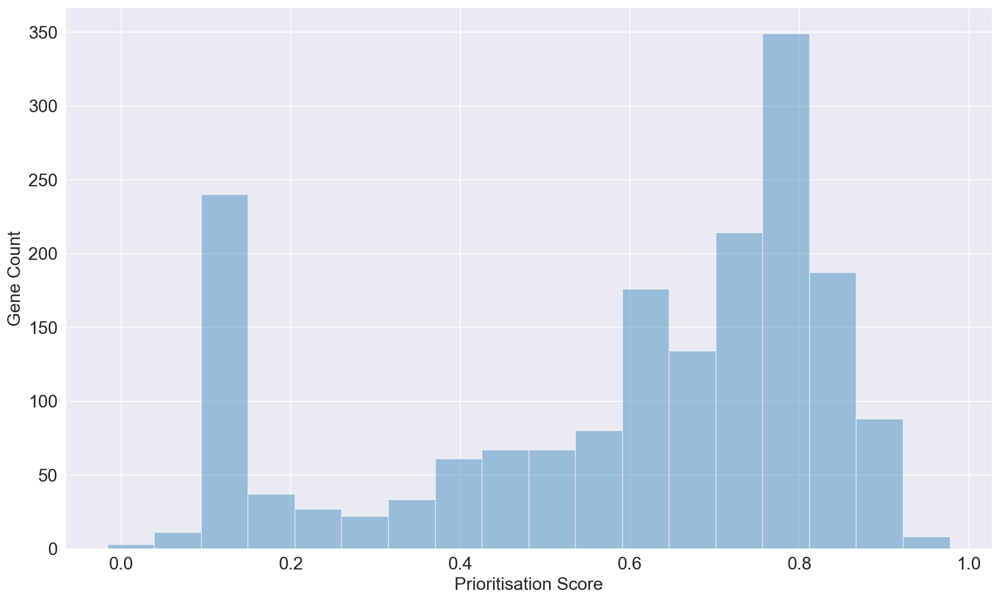

In [60]:
ax = sns.distplot(df_total["XGB_Score"], kde=False, norm_hist=False)
ax.set_xlabel("Prioritisation Score", fontsize=16)
ax.set_ylabel("Gene Count", fontsize=16)
ax.tick_params(labelsize=16)

### SHAP Feature Importance Visualization:

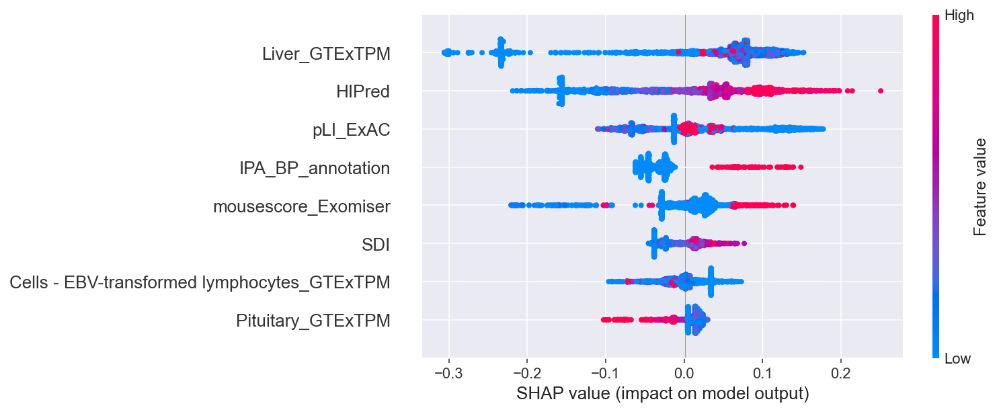

In [61]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X2)
shap.summary_plot(shap_values, X2)

In [62]:
expected_value = explainer.expected_value

In [63]:
select = range(8)
features = X2.iloc[select]
features_display = X2.loc[features.index]
shap_values = explainer.shap_values(X2)
shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[:1804, :],
    X2.iloc[:1804, :],
    features_display,
)

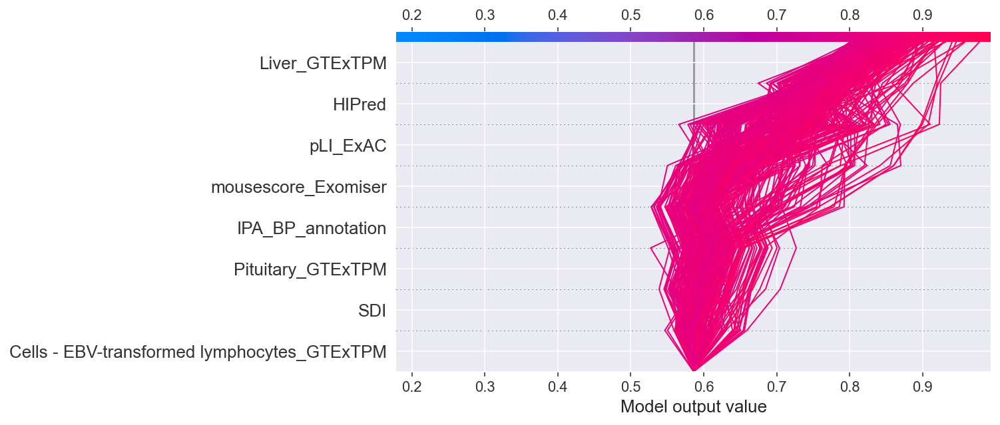

In [64]:
y_pred = model.predict(X2)

T = X2[(y_pred >= 0.8)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [65]:
L = [331, 1505, 827, 1444, 306, 329, 463, 1513, 114, 1171]
X10 = X2.loc[L]

In [66]:
df10 = df_total.nlargest(10, "XGB_Score", keep="last")
df10 = df10[
    [
       "SDI",
        "Liver_GTExTPM",
        "Cells - EBV-transformed lymphocytes_GTExTPM",
        "Pituitary_GTExTPM",
        "pLI_ExAC",
        "mousescore_Exomiser",
        "HIPred",
        "IPA_BP_annotation",
    ]
]

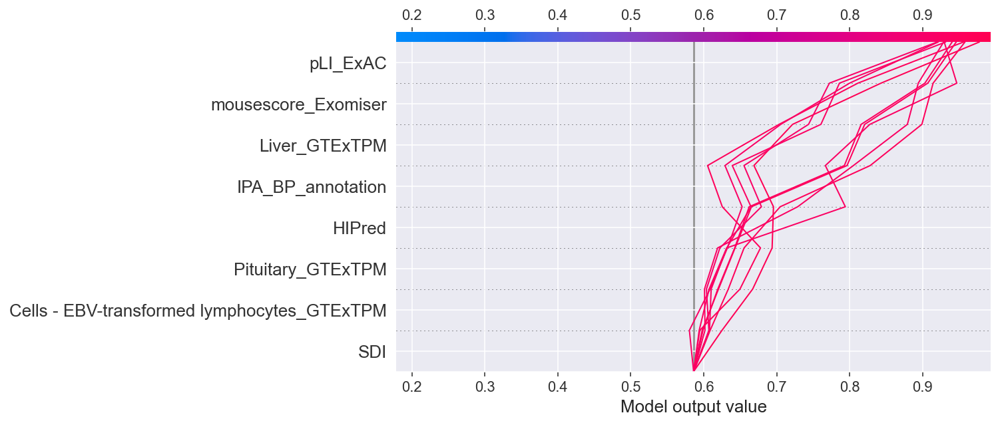

In [67]:
T = X10

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [68]:
select = range(8)
features = X10.iloc[select]
features_display = X10.loc[features.index]
shap_values = explainer.shap_values(X10)
shap.initjs()
shap.force_plot(
    explainer.expected_value, shap_values[:10, :], X10.iloc[:10, :], features_display,
)

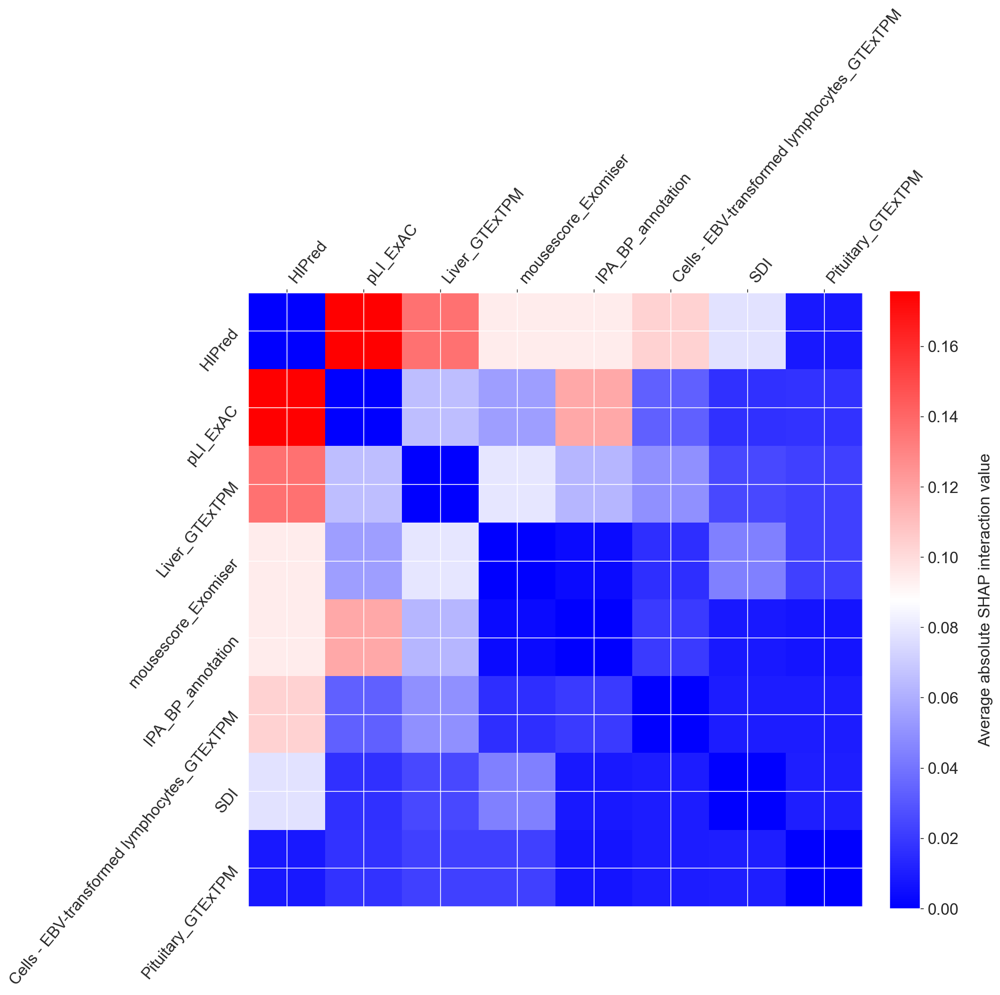

In [69]:
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(X10)
X_interaction10 = pd.DataFrame(data=X10, columns=df10.columns)


tmp = np.abs(shap_interaction_values).sum(0)
for i in range(tmp.shape[0]):
    tmp[i, i] = 0
inds = np.argsort(-tmp.sum(0))[:50]
tmp2 = tmp[inds, :][:, inds]
plt.figure(figsize=(12, 12))
plt.imshow(
    tmp2, cmap="bwr"
)  # https://matplotlib.org/stable/gallery/color/colormap_reference.html
plt.yticks(
    range(tmp2.shape[0]),
    X_interaction10.columns[inds],
    rotation=50.4,
    horizontalalignment="right",
)
plt.xticks(
    range(tmp2.shape[0]),
    X_interaction10.columns[inds],
    rotation=50.4,
    horizontalalignment="left",
)
plt.gca().xaxis.tick_top()
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label("Average absolute SHAP interaction value", size=16, labelpad=20)
plt.rcParams.update({"font.size": 16})
plt.show()

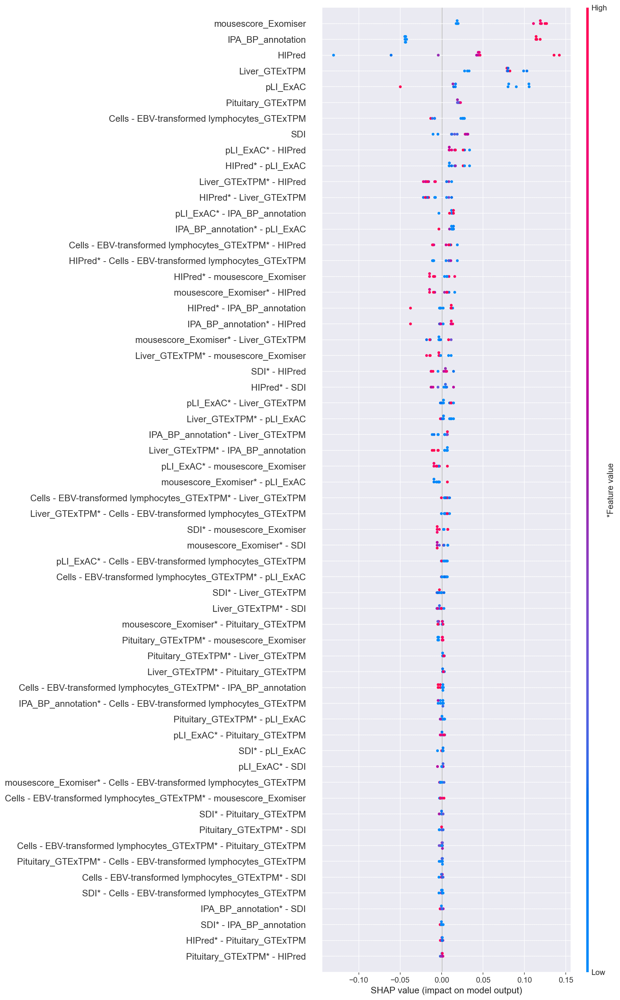

In [70]:
shap.summary_plot(shap_interaction_values, X10, max_display=60, plot_type="compact_dot")

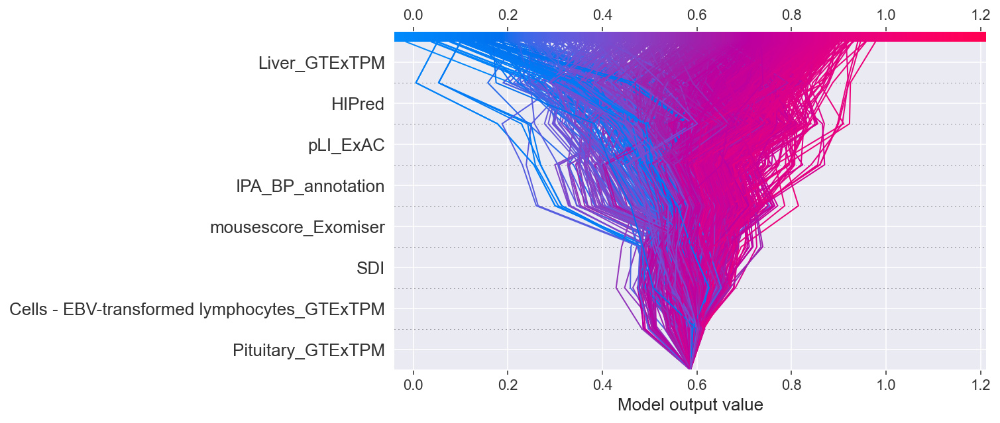

In [71]:
shap_values = explainer.shap_values(X2)
expected_value = explainer.expected_value
shap.decision_plot(expected_value, shap_values, X2)

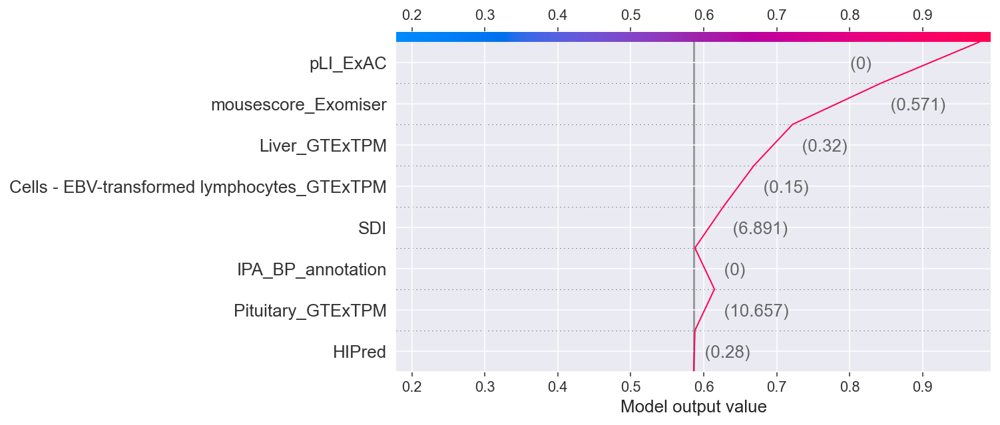

In [72]:
shap.decision_plot(expected_value, shap_values[331], X2.iloc[331])

In [73]:
gene1 = df_total[df_total["Gene"].str.contains("BDNF-AS")]
print(gene1)

        Gene  REVEL.max  MetaSVM_rankscore.max  MetaLR_rankscore.max  \
167  BDNF-AS        NaN                    NaN                   NaN   

     MCAP.max  wgEncodeBroadHmmHuvecHMM.count  betamax  logpval_gwascatalog  \
167       NaN                              44   0.6005            16.522879   

     Adipose - Subcutaneous_GTExTPM  Adipose - Visceral (Omentum)_GTExTPM  \
167                         1.55952                               1.27877   

     ...  MetaLR_rankscore  MetaSVM_rankscore  MutationAssessor_rankscore  \
167  ...           0.85277            0.86711                     0.80626   

     REVEL_score  fathmm-MKL_coding_score  integrated_fitCons_rankscore  \
167        0.848                  0.99098                       0.73137   

     LoFtool  GERP_Rankscore  BPlabel  XGB_Score  
167    0.212         0.98982  unknown   0.464697  

[1 rows x 169 columns]


In [74]:
X2.iloc[167]

SDI                                            3.923801
Liver_GTExTPM                                  0.884741
Cells - EBV-transformed lymphocytes_GTExTPM    0.714512
Pituitary_GTExTPM                              4.283150
pLI_ExAC                                       0.165509
mousescore_Exomiser                            0.004888
HIPred                                         0.417264
IPA_BP_annotation                              0.000000
Name: 167, dtype: float64

In [75]:
X_importance = X2
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_importance)

shap.initjs()

# Write in a function
def shap_plot(j):
    explainerModel = shap.TreeExplainer(model)
    shap_values_Model = explainerModel.shap_values(X2)
    p = shap.force_plot(
        explainerModel.expected_value,
        shap_values_Model[j],
        X2.iloc[[j]],
        feature_names=df2.columns,
    )
    return p


shap_plot(167)

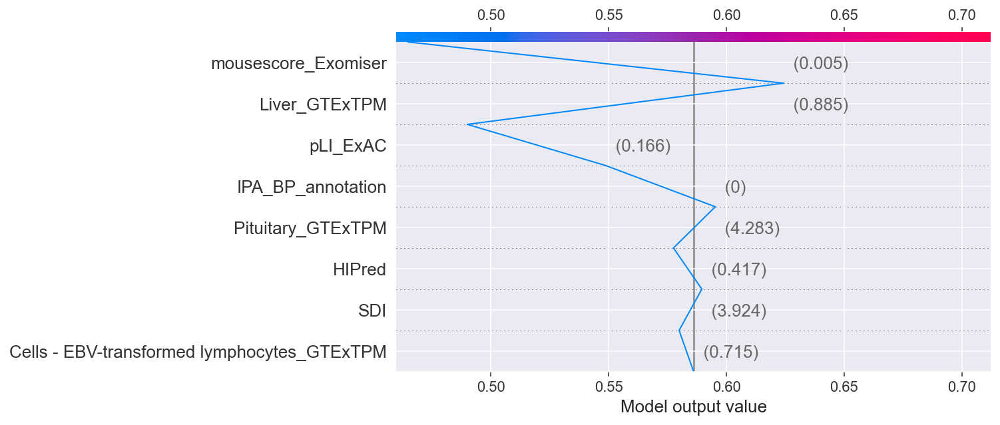

In [76]:
explainer = shap.TreeExplainer(model)

expected_value = explainer.expected_value
select = range(8)
features = X2.iloc[select]
features_display = X2.loc[features.index]
shap_values = explainer.shap_values(X2)
shap.decision_plot(
    expected_value, shap_values[167], X2.iloc[167], list(features_display)
)